# [Python Reference Link](http://www.data8.org/sp20/python-reference.html)
*Run the cell below so that we can set our modules up*# Importing our modules

In [ ]:
import numpy as np
from datascience import *
import math as m

# These lines do some fancy plotting magic.
import matplotlib
%matplotlib inline
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import warnings
warnings.simplefilter('ignore', FutureWarning)

In [ ]:
birds = Table.read_table('snowy_plover.csv')
birds

# The Residual & The Root Mean Square Error

In [ ]:
# Let's run this cell 

def x_y_estimate_residual(table, x_col, y_col):
    x_array = table.column(x_col)
    y_array = table.column(y_col)

    x_mean = np.mean(x_array)
    x_std = np.std(x_array)

    y_mean = np.mean(y_array)
    y_std = np.std(y_array)

    x_su = (x_array - x_mean)/x_std
    y_su = (y_array - y_mean)/y_std

    r_value = np.mean(x_su*y_su)
    slope = r_value*(y_std/x_std)
    intercept = y_mean - slope * x_mean
    
    estimate = slope*x_array + intercept
    
    output_table = table.select(x_col,y_col).with_columns('Estimate',estimate,
                                                          'Residual',y_array - estimate)
    print(slope,intercept)
    
    return output_table

def lin_reg_slope_intercept(table,x_col,y_col):
    x_array = birds.column(x_col)
    y_array = birds.column(y_col)

    x_mean = np.mean(x_array)
    x_std = np.std(x_array)

    y_mean = np.mean(y_array)
    y_std = np.std(y_array)

    x_su = (x_array - x_mean)/x_std
    y_su = (y_array - y_mean)/y_std

    r_value = np.mean(x_su*y_su)
    slope = r_value*(y_std/x_std)
    intercept = y_mean - slope * x_mean
    
    return make_array(slope,intercept)

x_y_estimate_residual(birds,'Egg Weight','Bird Weight')

In [ ]:
residual = x_y_estimate_residual(birds,'Egg Weight','Bird Weight').column('Residual')
residual

In [ ]:
birds_with_residual = birds.with_columns('Residual',residual)
birds_with_residual

## The Root Mean Square Error Formula
<img src="root_mean_square_error.png" alt="drawing" width="1200"/>

In [ ]:
error = residual

#### Square the Error

In [ ]:
squared_error = error**2

#### Take the **mean** of the squared errors

In [ ]:
mean_squared_error = np.mean(squared_error)

#### Take the square root 

In [ ]:
root_mean_squared_error = np.sqrt(mean_squared_error)
root_mean_squared_error

#### Let's put it all together in a one-line calculation

In [ ]:
#let's put it all together in a one-line calculation
root_mean_square_error = np.sqrt(np.mean(error**2))
root_mean_square_error

### Let's define the function `rmse` to calculate the root mean square error

Given any proposed slope & intercept, it will calculate the root mean square error of the estimated column of 'Bird Weights' corresponding to the column of 'Egg Weights'

In [ ]:
def rmse(slope,intercept):
    x_array = birds.column('Egg Weight')
    y_array = birds.column('Bird Weight')
    
    prediction = slope*x_array + intercept
    prediction_error = y_array - prediction
    
    return np.sqrt(np.mean(prediction_error**2))

In [ ]:
m_b_array = lin_reg_slope_intercept(birds,'Egg Weight','Bird Weight')
m_slope = m_b_array.item(0)
b_intercept = m_b_array.item(1)
print(m_slope,b_intercept)

In [ ]:
rmse(m_slope,b_intercept)

In [ ]:
test_m = 0.5
test_b = 10
print(rmse(test_m,test_b))

graph_x_min = min(birds.column('Egg Weight'))-.2
graph_x_max = max(birds.column('Egg Weight'))+.2

graph_y_min = test_m*graph_x_min +test_b
graph_y_max = test_m*graph_x_max +test_b

birds.scatter('Egg Weight','Bird Weight')
plt.plot(make_array(graph_x_min,graph_x_max),make_array(graph_y_min,graph_y_max))

In [ ]:
rmse(.075,0.5)

In [ ]:
rmse(.025,1.5)

In [ ]:
rmse(5,10)

In [ ]:
rmse(2,1)

In [ ]:
slopes = make_array()
intercepts = make_array()
these_rmse = make_array()

for m in np.arange(0,2,0.1):
    for b in np.arange(-1,1,0.1):
        
        #storing the slope-intercept pair into their respective arrays
        slopes = np.append(slopes,m)
        intercepts = np.append(intercepts,b)
        
        # calculates the root mean square error of the the slope-intercept pair above
        this_rmse = rmse(m,b)
        
        #stores the resulting rmse into it's own array
        these_rmse = np.append(these_rmse,this_rmse)

#combining the three arrays above into a table
slope_intercept_residual_table = Table().with_columns('Slopes (m)',slopes,
                                    'Intercepts (b)', intercepts,
                                    'RMSE',these_rmse)
slope_intercept_residual_table.show()
slope_intercept_residual_table.num_rows

In [ ]:
slopes = make_array()
intercepts = make_array()
these_rmse = make_array()

for m in np.arange(0,2,0.01):
    for b in np.arange(-1,1,0.01):
        this_rmse = rmse(m,b)
        
        slopes = np.append(slopes,m)
        intercepts = np.append(intercepts,b)
        these_rmse = np.append(these_rmse,this_rmse)

slope_intercept_residual_table = Table().with_columns('Slopes (m)',slopes,
                                    'Intercepts (b)', intercepts,
                                    'RMSE',these_rmse)
slope_intercept_residual_table.show()
slope_intercept_residual_table.num_rows

In [ ]:
slope_intercept_residual_table.sort('RMSE')

In [ ]:
len(slope_intercept_residual_table.column('RMSE'))

In [ ]:
sorted_slope_intercept_residual_table = slope_intercept_residual_table.sort('RMSE')

slopes_x = sorted_slope_intercept_residual_table.column('Slopes (m)')
intercepts_y = sorted_slope_intercept_residual_table.column('Intercepts (b)')
residual_colors = sorted_slope_intercept_residual_table.column('RMSE')


plt.figure(figsize=(6,6))
plt.scatter(slopes_x, intercepts_y, c = residual_colors, cmap="Blues_r")
plt.colorbar()
plt.xlabel('Slope')
plt.ylabel('Intercept') 

# The `minimize` function and Optimization

In [ ]:
minimize(rmse)

In [ ]:
#re-printing what we originally calculated using the formulas above
print(m_slope,b_intercept)

In [ ]:
def parabola(x):
    return x**2 +6*x +9

minimize(parabola)

# Looking at Distance with Spotify Data from Kaggle 
(link to Kaggle: [https://www.kaggle.com/datasets/multispiros/34740-hit-and-nonhit-songs-spotify-features/data?select=complete.csv](https://www.kaggle.com/datasets/multispiros/34740-hit-and-nonhit-songs-spotify-features/data?select=complete.csv))

In [ ]:
spotify =  Table.read_table("spotify_complete.csv")
spotify

track_title,artist_name,track_id,duration_ms,energy,key,mode,time_signature,acousticness,danceability,instrumentalness,liveness,loudness,speechiness,valence,tempo,On_chart
Red Planet - Red Planet Radio,Joe,3FeufAV1f6fajILIQuAXMw,256080,0.968,7,0,4,0.0215,0.698,0.862,0.111,-11.012,0.0337,0.39,136.884,0
Red Planet - Red Planet Extended,Joe,2o7oYjZuo3S2QitY4R5dII,395442,0.97,2,1,4,0.00339,0.724,0.896,0.106,-8.415,0.0358,0.432,136.868,0
Basejump,Robin Schulz,6nWoNNkfffbmHU9z3kGPao,391680,0.406,5,0,4,0.00433,0.803,0.825,0.0948,-9.444,0.0608,0.0769,125.014,0
"Goldberg Variations, BWV 988 (Arr. for Accordion): Var. ...",Johann Sebastian Bach,5Zg1UOcmee5oiRw3gbXna0,347840,0.00267,7,0,5,0.91,0.15,0.0287,0.125,-24.701,0.0434,0.105,135.652,0
"Goldberg Variations, BWV 988 (Arr. for Accordion): Var. ...",Johann Sebastian Bach,2ZWmWGoZS2OTGZSnMhck7Q,181733,0.226,7,1,4,0.768,0.29,1.59e-06,0.105,-14.99,0.0385,0.47,98.348,0
"Goldberg Variations, BWV 988 (Arr. for Accordion): Var. 17",Johann Sebastian Bach,661TNSoZ1MXPxyQEREFsFe,147787,0.248,2,1,3,0.936,0.32,0.0585,0.181,-19.526,0.0499,0.768,86.745,0
"Goldberg Variations, BWV 988 (Arr. for Accordion): Var. ...",Johann Sebastian Bach,4JXj4Qk0RHNQQ15GkT08nF,106520,0.0526,7,1,4,0.746,0.0734,2.57e-05,0.144,-19.889,0.0346,0.23,78.884,0
"Goldberg Variations, BWV 988 (Arr. for Accordion): Var. 19",Johann Sebastian Bach,7i4YGUcM5u6V0H0qnchPdR,79067,0.112,7,1,3,0.859,0.378,0,0.471,-18.817,0.0345,0.549,76.519,0
"Goldberg Variations, BWV 988 (Arr. for Accordion): Var. 20",Johann Sebastian Bach,2DNE9VF9q2j1P3RbJzR9QE,143133,0.205,7,1,4,0.971,0.297,0.756,0.158,-19.04,0.0418,0.92,168.752,0
"Goldberg Variations, BWV 988 (Arr. for Accordion): Var. ...",Johann Sebastian Bach,0ZcY9yY5lE0TMt2WZNVLSJ,234333,0.0197,7,0,4,0.947,0.16,0.211,0.107,-22.972,0.0384,0.154,68.39,0


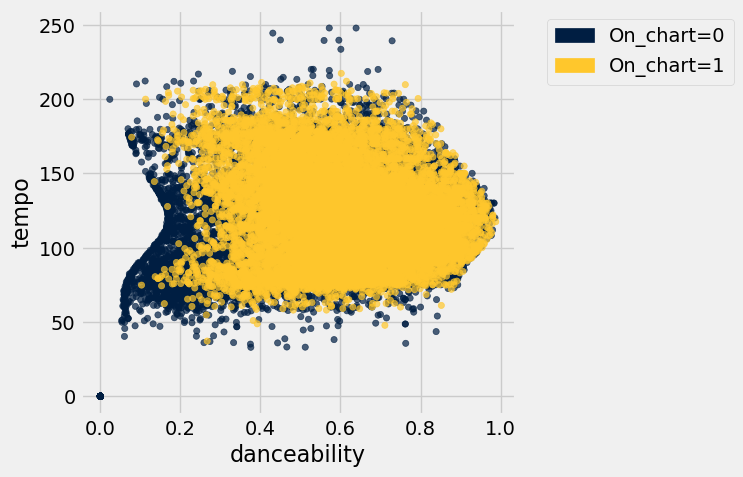

In [ ]:
#let's pick two of the column labels above and observe the scatter plot. 
# Note that the points are color-coordinated based upon whether they are considered a hit song or not. 
# 'On_chart = 1' means the song is considered a hit song

spotify.scatter('danceability' , 'tempo' , group = 'On_chart')

# Identifying key variables for classification

In [ ]:
spotify.where('artist_name','Queen')

track_title,artist_name,track_id,duration_ms,energy,key,mode,time_signature,acousticness,danceability,instrumentalness,liveness,loudness,speechiness,valence,tempo,On_chart
Bohemian Rhapsody - Remastered 2011,Queen,7tFiyTwD0nx5a1eklYtX2J,354320,0.402,0,0,4,0.288,0.392,0,0.243,-9.961,0.0536,0.228,143.883,1
Another One Bites The Dust - Remastered 2011,Queen,5vdp5UmvTsnMEMESIF2Ym7,214653,0.528,5,0,4,0.112,0.933,0.312,0.163,-6.472,0.161,0.754,109.967,1
Don't Stop Me Now - Remastered,Queen,5T8EDUDqKcs6OSOwEsfqG7,209413,0.868,5,1,4,0.0475,0.559,0.000176,0.776,-5.276,0.17,0.609,156.295,1
Somebody To Love - Remastered 2011,Queen,6cFZ4PLC19taNlpl9pbGMf,296493,0.693,8,1,3,0.19,0.497,0,0.215,-7.024,0.0565,0.358,111.539,1
Under Pressure - Remastered,Queen,2fuCquhmrzHpu5xcA1ci9x,248440,0.712,2,1,4,0.429,0.671,0,0.103,-7.815,0.0476,0.462,113.805,1
We Will Rock You - Remastered,Queen,4pbJqGIASGPr0ZpGpnWkDn,122067,0.497,2,1,4,0.676,0.692,0,0.259,-7.316,0.119,0.475,81.308,1
Killer Queen - Remastered 2011,Queen,7GqWnsKhMtEW0nzki5o0d8,179600,0.65,10,1,4,0.379,0.535,0,0.14,-6.328,0.0554,0.61,117.188,1
Thank God It's Christmas - Non-Album Single,Queen,2xGO2UjzxeVQSIkyg98vck,261627,0.421,7,1,5,0.214,0.296,0,0.232,-8.891,0.0285,0.335,83.425,1
You're My Best Friend,Queen,49L5s7lTES5EVnyGO09H0S,177893,0.727,0,1,4,0.0428,0.567,0.906,0.0991,-8.802,0.0435,0.577,120.998,1
Tie Your Mother Down,Queen,6K8gEgGkOyD1wFY3kAcyOy,286693,0.886,2,1,4,0.094,0.327,0.000195,0.35,-5.6,0.0722,0.16,134.991,1


In [ ]:
spotify.show(3)

track_title,artist_name,track_id,duration_ms,energy,key,mode,time_signature,acousticness,danceability,instrumentalness,liveness,loudness,speechiness,valence,tempo,On_chart
Red Planet - Red Planet Radio,Joe,3FeufAV1f6fajILIQuAXMw,256080,0.968,7,0,4,0.0215,0.698,0.862,0.111,-11.012,0.0337,0.39,136.884,0
Red Planet - Red Planet Extended,Joe,2o7oYjZuo3S2QitY4R5dII,395442,0.97,2,1,4,0.00339,0.724,0.896,0.106,-8.415,0.0358,0.432,136.868,0
Basejump,Robin Schulz,6nWoNNkfffbmHU9z3kGPao,391680,0.406,5,0,4,0.00433,0.803,0.825,0.0948,-9.444,0.0608,0.0769,125.014,0


/opt/conda/lib/python3.10/site-packages/datascience/tables.py:4700: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(n, 1, figsize=(width, height*n))


[{'energy', 'duration_ms'}, {'acousticness', 'duration_ms'}, {'danceability', 'duration_ms'}, {'instrumentalness', 'duration_ms'}, {'liveness', 'duration_ms'}, {'loudness', 'duration_ms'}, {'speechiness', 'duration_ms'}, {'valence', 'duration_ms'}, {'tempo', 'duration_ms'}, {'energy', 'acousticness'}, {'danceability', 'energy'}, {'instrumentalness', 'energy'}, {'liveness', 'energy'}, {'loudness', 'energy'}, {'energy', 'speechiness'}, {'valence', 'energy'}, {'tempo', 'energy'}, {'danceability', 'acousticness'}, {'instrumentalness', 'acousticness'}, {'liveness', 'acousticness'}, {'loudness', 'acousticness'}, {'speechiness', 'acousticness'}, {'valence', 'acousticness'}, {'tempo', 'acousticness'}, {'danceability', 'instrumentalness'}, {'danceability', 'liveness'}, {'danceability', 'loudness'}, {'danceability', 'speechiness'}, {'danceability', 'valence'}, {'danceability', 'tempo'}, {'instrumentalness', 'liveness'}, {'instrumentalness', 'loudness'}, {'instrumentalness', 'speechiness'}, {'ins

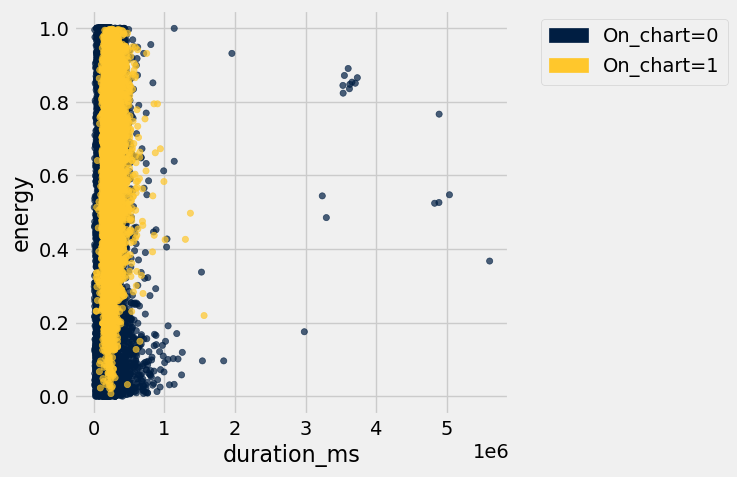

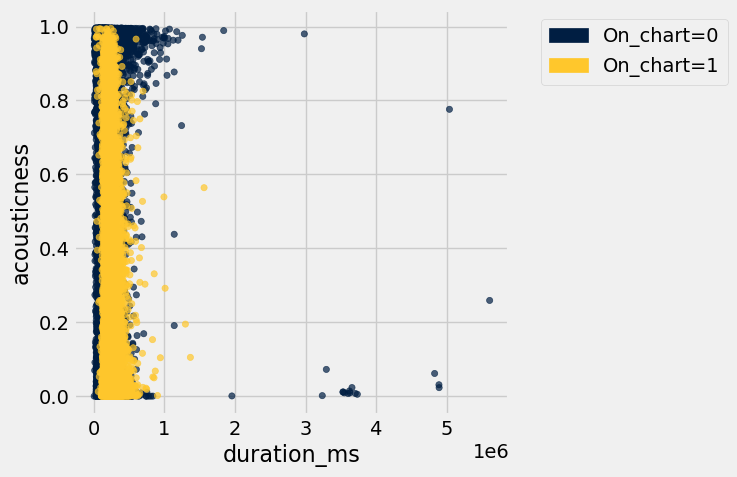

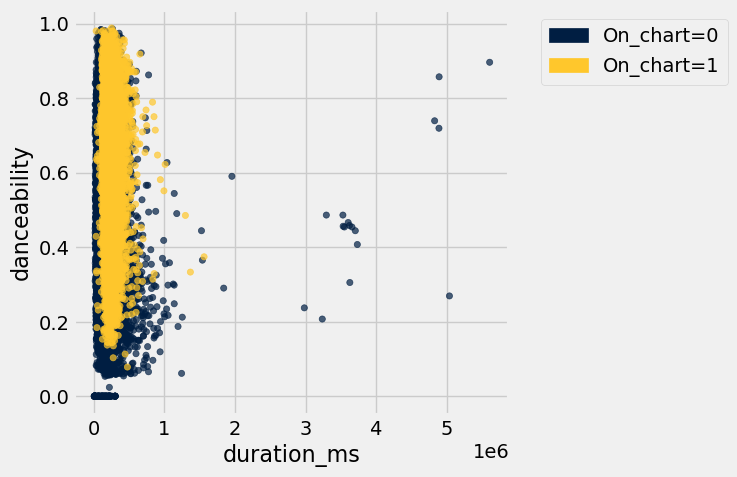

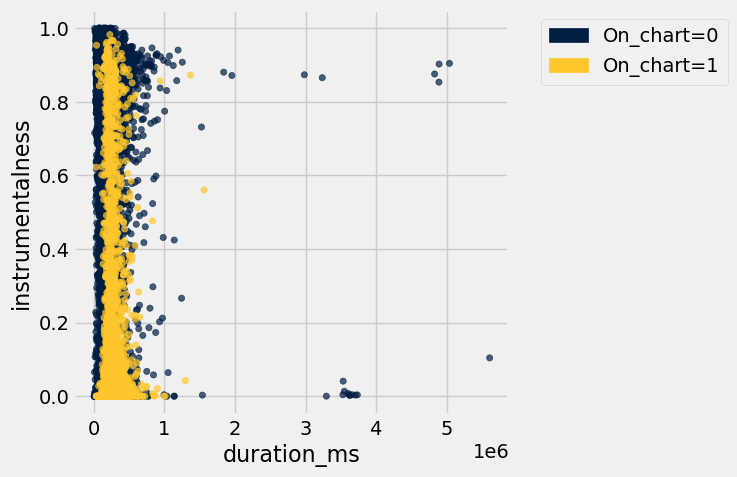

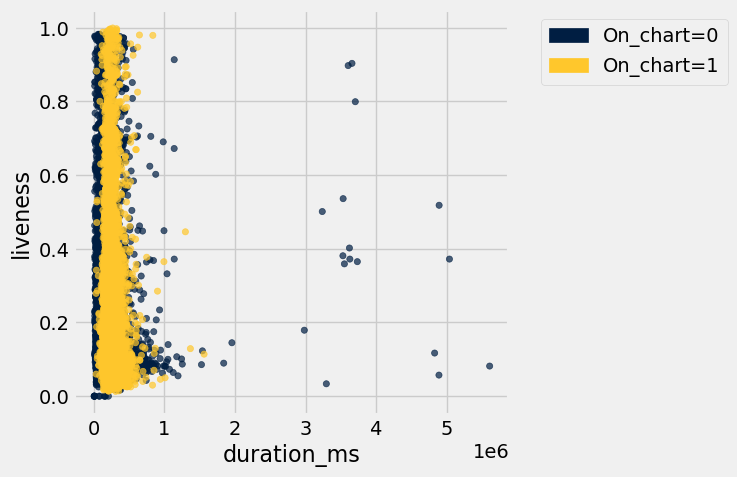

...

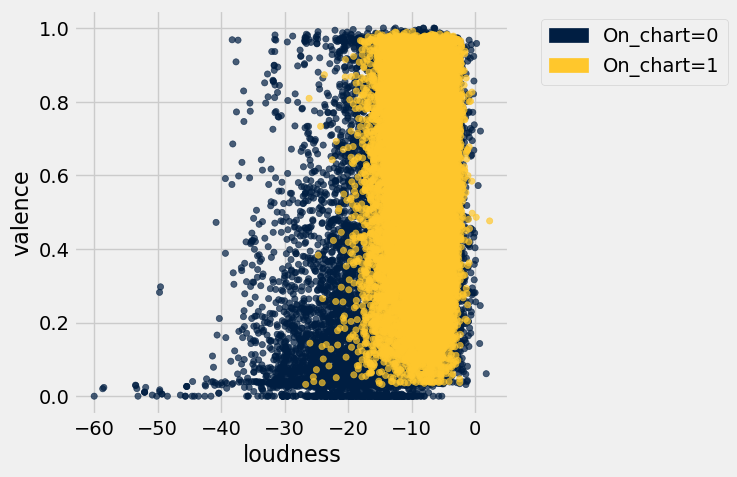

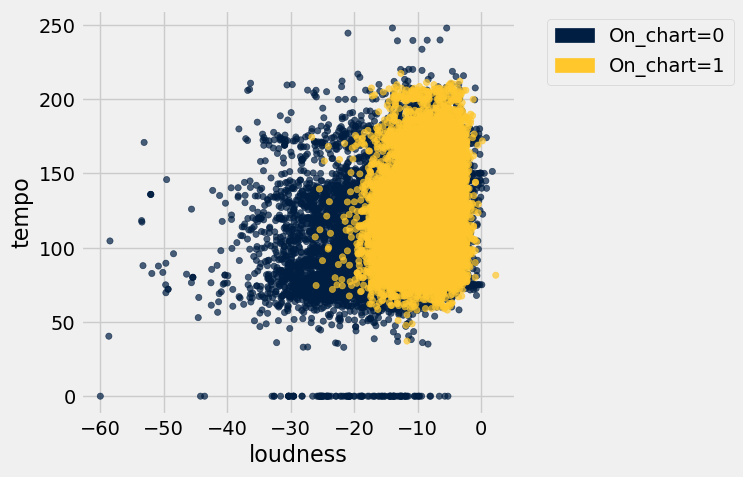

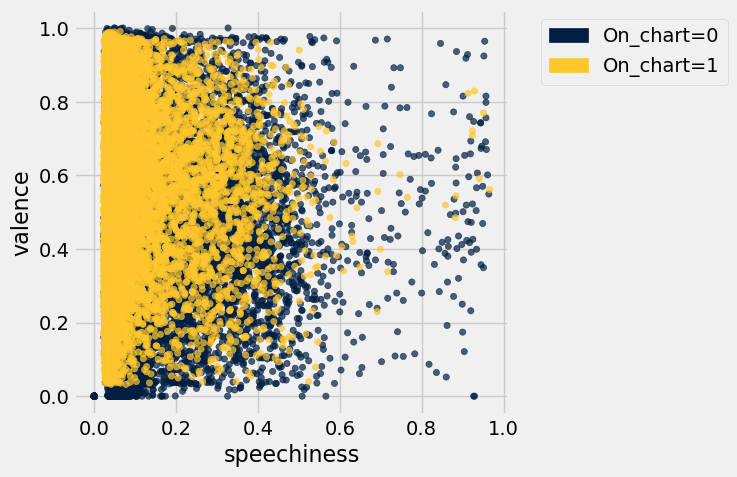

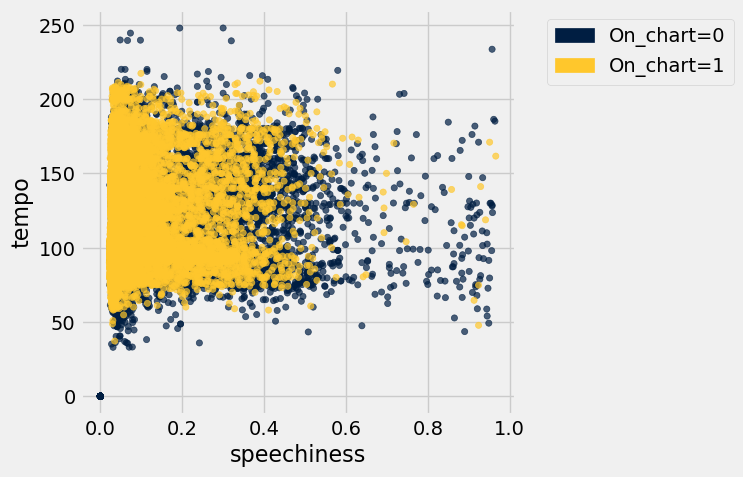

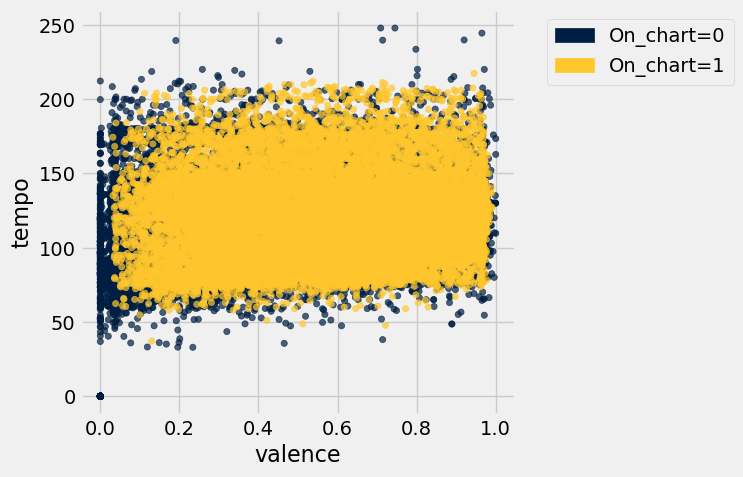

In [ ]:
#Now let's look at comparing ALL of the labels to each other in pairwise comparisons
#run the code below 

labels_for_spotify_songs = [
    #'track_title',
    # 'artist_name',
    # 'track_id',
    # 'duration_ms',
     'energy',
    # 'key',
    # 'mode',
    # 'time_signature',
     'acousticness',
     'danceability',
     'instrumentalness',
     'liveness',
     'loudness',
     'speechiness',
     'valence',
     'tempo']
#'On_chart' is purposely left out since we don't want it to be graphed on an axis and color our points instead

plotted_pairs = []

for x in labels_for_spotify_songs:
    for y in labels_for_spotify_songs:
        
        ordered_pair =  {x,y}
        
        if (x != y) and (ordered_pair not in plotted_pairs):
            spotify.scatter(x,y,group='On_chart')
            plotted_pairs.append(ordered_pair)
            
print(plotted_pairs)    

# The Distance Formula

In [ ]:
((3 - 0)**2 + (4 - 0)**2)**(0.5)

5.0

In [ ]:
first = make_array(0,0,0,0)
second = make_array(3,4,12,25)

(sum((first - second)**2))**(1/2)

28.178005607210743

#### The following function below is defined for you homework 12

In [ ]:
# row (input): a row from the table 
# features (input): an array of column labels. These labels are the attributes that will help us classify individuals. 
# Note: the attributes must be numerical to help us pass them through the distance function defined above. 

def row_to_array(row, features):
    """Converts a row to an array of its features."""
    arr = make_array()
    for feature in features:
        arr = np.append(arr, row.item(feature))
    return arr

In [ ]:
spotify.take(make_array(0,1,-1))

track_title,artist_name,track_id,duration_ms,energy,key,mode,time_signature,acousticness,danceability,instrumentalness,liveness,loudness,speechiness,valence,tempo,On_chart
Red Planet - Red Planet Radio,Joe,3FeufAV1f6fajILIQuAXMw,256080,0.968,7,0,4,0.0215,0.698,0.862,0.111,-11.012,0.0337,0.39,136.884,0
Red Planet - Red Planet Extended,Joe,2o7oYjZuo3S2QitY4R5dII,395442,0.97,2,1,4,0.00339,0.724,0.896,0.106,-8.415,0.0358,0.432,136.868,0
Gone,Dierks Bentley,7IhfjcaXuXCq20ZiAA7igK,205960,0.746,6,1,4,0.00985,0.521,0,0.0741,-6.173,0.0351,0.473,149.977,1


In [ ]:
labels_for_spotify_songs = [
    #'track_title',
    # 'artist_name',
    # 'track_id',
    # 'duration_ms',
     'energy',
    # 'key',
    # 'mode',
    # 'time_signature',
     'acousticness',
     'danceability',
     'instrumentalness',
     'liveness',
     'loudness',
     'speechiness',
     'valence',
     'tempo']

array_of_spotify_features = labels_for_spotify_songs

first_song = row_to_array(spotify.row(0),array_of_spotify_features)
second_song = row_to_array(spotify.row(1),array_of_spotify_features)
last_song = row_to_array(spotify.row(-1),array_of_spotify_features)

(sum((first_song - last_song)**2))**(0.5)

13.988374290549293

Let's convert the above process into a single function:

In [ ]:
def distance(array_one,array_two):
    return (sum((array_one - array_two)**2))**(0.5)

In [ ]:
distance(first_song,second_song)

2.5978110751361436

In [ ]:
distance(first_song,last_song)

13.988374290549293

In [ ]:
distance(second_song,last_song)

13.333018669138667

# Activity!
## Building a Song/Playlist Recommendation based on Distance

#### Use this cell to find a song that you like, make sure that the output is a row object. Feel free to use methods like `group` and `where` to help identify your song

In [ ]:
...
spotify#.row(0)

spotify.where('artist_name','Linkin Park').where('track_title','Breaking The Habit').row(0)

Row(track_title='Breaking The Habit', artist_name='Linkin Park', track_id='6n8TMVyFKoUmDc4apxceRD', duration_ms=196907, energy=0.84900000000000009, key=4, mode=0, time_signature=4, acousticness=0.108, danceability=0.57899999999999996, instrumentalness=0.0, liveness=0.090899999999999995, loudness=-5.218, speechiness=0.030300000000000001, valence=0.58099999999999996, tempo=100.021, On_chart=1)

#### Use the cell below to help define the features that you find most relevant to find songs of "closest distance"

In [ ]:
labels_for_spotify_songs = [
    #'track_title',
    # 'artist_name',
    # 'track_id',
    # 'duration_ms',
     'energy',
    # 'key',
    # 'mode',
    # 'time_signature',
     'acousticness',
     'danceability',
     'instrumentalness',
     'liveness',
     'loudness',
     'speechiness',
     'valence',
    # 'tempo',
     'On_chart']


fav_song = spotify.where('artist_name','Linkin Park').where('track_title','Breaking The Habit').row(0) #copy the last line from the above code cell

fav_song_array = row_to_array(fav_song,labels_for_spotify_songs)
fav_song_array

array([ 0.849 ,  0.108 ,  0.579 ,  0.    ,  0.0909, -5.218 ,  0.0303,
        0.581 ,  1.    ])

In [ ]:
# free cell (I was thinking you could use this cell to remove any song/artist you don't want recommended)
#spotify = spotify.where('artist_name',are.not_equal_to('Linkin Park'))

#### Use the cell below to write a for-loop that calculates the distance between your favorite song and every other song in the dataset.

In [ ]:
distances_to_fav_song = make_array()

for each_song_row in spotify.rows:
    song_row_array = row_to_array(each_song_row,labels_for_spotify_songs)
    song_row_distance =  distance(song_row_array,fav_song_array)
    distances_to_fav_song = np.append(distances_to_fav_song,song_row_distance)
    
spotify_with_distance = spotify.with_column('Distance',distances_to_fav_song)
spotify_with_distance

track_title,artist_name,track_id,duration_ms,energy,key,mode,time_signature,acousticness,danceability,instrumentalness,liveness,loudness,speechiness,valence,tempo,On_chart,Distance
Red Planet - Red Planet Radio,Joe,3FeufAV1f6fajILIQuAXMw,256080,0.968,7,0,4,0.0215,0.698,0.862,0.111,-11.012,0.0337,0.39,136.884,0,5.94863
Red Planet - Red Planet Extended,Joe,2o7oYjZuo3S2QitY4R5dII,395442,0.97,2,1,4,0.00339,0.724,0.896,0.106,-8.415,0.0358,0.432,136.868,0,3.47746
Basejump,Robin Schulz,6nWoNNkfffbmHU9z3kGPao,391680,0.406,5,0,4,0.00433,0.803,0.825,0.0948,-9.444,0.0608,0.0769,125.014,0,4.47794
"Goldberg Variations, BWV 988 (Arr. for Accordion): Var. ...",Johann Sebastian Bach,5Zg1UOcmee5oiRw3gbXna0,347840,0.00267,7,0,5,0.91,0.15,0.0287,0.125,-24.701,0.0434,0.105,135.652,0,19.554
"Goldberg Variations, BWV 988 (Arr. for Accordion): Var. ...",Johann Sebastian Bach,2ZWmWGoZS2OTGZSnMhck7Q,181733,0.226,7,1,4,0.768,0.29,1.59e-06,0.105,-14.99,0.0385,0.47,98.348,0,9.86974
"Goldberg Variations, BWV 988 (Arr. for Accordion): Var. 17",Johann Sebastian Bach,661TNSoZ1MXPxyQEREFsFe,147787,0.248,2,1,3,0.936,0.32,0.0585,0.181,-19.526,0.0499,0.768,86.745,0,14.3833
"Goldberg Variations, BWV 988 (Arr. for Accordion): Var. ...",Johann Sebastian Bach,4JXj4Qk0RHNQQ15GkT08nF,106520,0.0526,7,1,4,0.746,0.0734,2.57e-05,0.144,-19.889,0.0346,0.23,78.884,0,14.7533
"Goldberg Variations, BWV 988 (Arr. for Accordion): Var. 19",Johann Sebastian Bach,7i4YGUcM5u6V0H0qnchPdR,79067,0.112,7,1,3,0.859,0.378,0,0.471,-18.817,0.0345,0.549,76.519,0,13.6831
"Goldberg Variations, BWV 988 (Arr. for Accordion): Var. 20",Johann Sebastian Bach,2DNE9VF9q2j1P3RbJzR9QE,143133,0.205,7,1,4,0.971,0.297,0.756,0.158,-19.04,0.0418,0.92,168.752,0,13.9276
"Goldberg Variations, BWV 988 (Arr. for Accordion): Var. ...",Johann Sebastian Bach,0ZcY9yY5lE0TMt2WZNVLSJ,234333,0.0197,7,0,4,0.947,0.16,0.211,0.107,-22.972,0.0384,0.154,68.39,0,17.8325


In [ ]:
#extra cells for further examination
top_15 = spotify_with_distance.sort('Distance').take(np.arange(15))
top_15.show()

track_title,artist_name,track_id,duration_ms,energy,key,mode,time_signature,acousticness,danceability,instrumentalness,liveness,loudness,speechiness,valence,tempo,On_chart,Distance
Breaking The Habit,Linkin Park,6n8TMVyFKoUmDc4apxceRD,196907,0.849,4,0,4,0.108,0.579,0,0.0909,-5.218,0.0303,0.581,100.021,1,0
Lettin' The Night Roll,Justin Moore,33LSgUa20mKNgeut1XwP2E,203120,0.859,2,1,4,0.0873,0.542,0,0.145,-5.137,0.0424,0.637,140.9,1,0.12111
Neon Eyes,Morgan Wallen,3kOi5KZTcCOdqFlUjF9CDZ,226147,0.843,11,0,4,0.0214,0.576,8.04e-05,0.157,-5.26,0.029,0.628,126.009,1,0.126049
Friends,BTS,7w05lsU2VLSeiT8Nukrv5M,199339,0.747,1,1,4,0.0668,0.55,0,0.0536,-5.211,0.0407,0.648,79.98,1,0.137768
Good Girls,5 Seconds of Summer,5XwIdRXvHTtxH5BmBOSCCM,206424,0.915,4,1,4,0.0131,0.531,0,0.119,-5.215,0.0828,0.557,141.06,1,0.140701
Best Days Of Your Life,Kellie Pickler,27BMLvWD1TYdosiReVgbAt,226800,0.862,9,1,4,0.0231,0.65,0,0.0728,-5.148,0.0567,0.541,127.946,1,0.141218
Mikrokosmos,BTS,5hnbE5BF2e8BCk9OMR1UVC,224225,0.858,8,1,3,0.125,0.58,0,0.0502,-5.212,0.114,0.475,174.039,1,0.142496
Pink Houses,John Mellencamp,5JKQMoGmXwDHCodn5pFVHB,283667,0.795,7,1,4,0.0514,0.635,3.08e-06,0.0751,-5.313,0.0269,0.628,115.23,1,0.144051
Come & Go,Juice WRLD,7y7w4tl4MaRC2UMEj1mPtr,205485,0.814,0,1,4,0.0172,0.625,0,0.158,-5.181,0.0657,0.535,144.991,1,0.144313
Come & Go,Juice WRLD & Marshmello,2Y0wPrPQBrGhoLn14xRYCG,205485,0.814,0,1,4,0.0172,0.625,0,0.158,-5.181,0.0657,0.535,144.991,1,0.144313


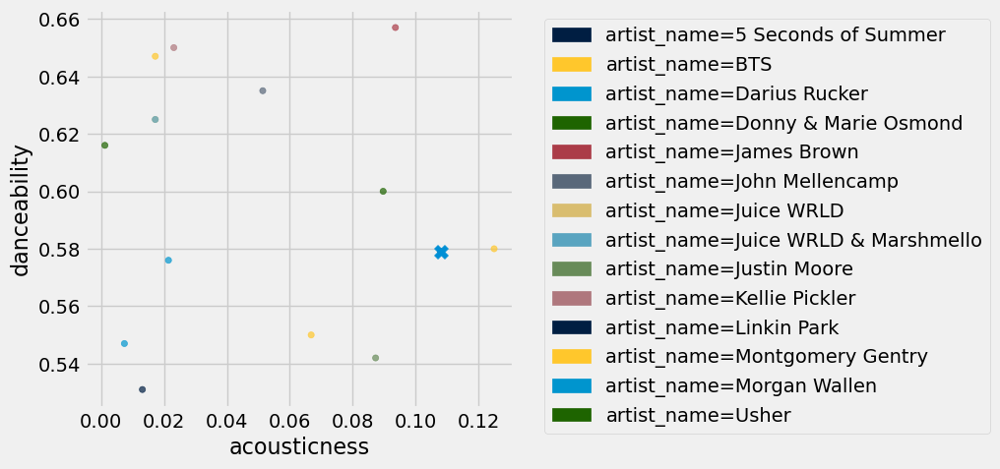

In [ ]:
top_15.scatter('acousticness','danceability',group = 'artist_name')
plt.scatter(0.108, 0.5790, marker = 'X', s = 100)

## Reflection Question: 
### What was the song you chose, and what recommendation do you have based upon the song? Do you agree with this recommendation?? Why or why not?

*__Type your answer here replacing this text__*